In [2]:
import os
import nibabel as nib
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import nilearn
from nilearn import image
from nilearn.image import load_img
from nilearn.image import math_img
from nilearn.image import resample_to_img
from scipy import stats
from scipy.stats import pearsonr
from scipy.stats import spearmanr

In [10]:
#resample all atlas regions- need to change paths
def resample(regions):
    #load in each atlas file
    roi_lh = load_img(f'/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Atlas/lh/{regions}.nii.gz')
    roi_rh = load_img(f'/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Atlas/rh/{regions}.nii.gz')
    #load in STNs to resample atlas to
    stn_lh = load_img('/Volumes/Cingulate/NativeMNI_Overlaps/Berlin51/Hotspots&Atlas/resampled/STN_lh.nii.gz')
    stn_rh = load_img('/Volumes/Cingulate/NativeMNI_Overlaps/Berlin51/Hotspots&Atlas/resampled/STN_rh.nii.gz')
    
    #run the resample code, atlas roi to stn
    re_roi_lh = resample_to_img(roi_lh,stn_lh,interpolation='nearest')
    re_roi_rh = resample_to_img(roi_rh,stn_rh,interpolation='nearest')
    
    #save resampled files to folder
    nib.save(re_roi_lh,f'/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Atlas/resampled/{regions}_lh.nii.gz')
    nib.save(re_roi_rh,f'/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Atlas/resampled/{regions}_rh.nii.gz')

regions = ['GPe','GPi','H','H1','H2','PBPn','RN','RNc','SN','STN','Suppml','ZI','fct','fr','icml','lml','mml','mmt','palhy','rimlf','rt','tbmn']

for r in regions:
    resample(r)

In [18]:
#get volumes of overlap, bilateral, and mm
#load in subject directory to get IDs
directory = [i for i in os.listdir('/Volumes/Cingulate/NativeMNI_Overlaps/Berlin51/FieldTrip') if i.startswith('sub')]
#write out all regions like above
regions = ['GPe','GPi','H','H1','H2','PBPn','RN','RNc','SN','STN','Suppml','ZI','fct','fr','icml','lml','mml','mmt','palhy','rimlf','rt','tbmn']

#create dictionaries to store results
sub_ids = {'IDs': []} #for the subject IDs
mni_overlap = {f'{r}_Overlap_LH': [] for r in regions} #LH overlap values
mni_overlap.update({f'{r}_Overlap_RH': [] for r in regions}) #RH overlap values
mni_bilateral_overlap = {f'{r}_Overlap_BI': [] for r in regions} #bilateral overlap values
mni_bilateral_mm = {f'{r}_Overlap_BI_MM': [] for r in regions} #mm overlap values

def get_binary_overlap(roi,sub,volume_list): #function that gets the binary overlap
    #multiply the binarized atlas roi with each subject, all overlapping voxels remain = 1, everything else is 0
    mask = math_img('img1*img2',img1=roi,img2=sub) 
    mask = mask.get_fdata() #convert 3D nii file to a 2D array
    volume = np.sum(mask) #take sum of all voxel values, everything is 1, so that is summed up
    volume_list.append(volume) #add sum values to LH and RH dictionaries for each subject
    
def binary_bilateral(list1,list2,sums_list): #add LH and RH values together to get bilateral
    sums = [(x + y) for x, y in zip(list1, list2)]
    sums_list.extend(sums) #add summed bilateral values to dictionary
    
def convert(bi_list, vox, mm_list): #convert voxels into mm
    for n in bi_list:
        mm = n * (vox[0] * vox[1] * vox[2]) #multiply summed bilateral voxel value with cubic mm value
        mm_list.append(mm) #add this output to mm dictionary
    
for i in directory: #loop over all subjects
    for r in regions: #loop over all regions
        #load in atlas regions- change path
        roi_lh = load_img(f'/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Atlas/resampled/{r}_lh.nii.gz')
        roi_rh = load_img(f'/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Atlas/resampled/{r}_rh.nii.gz')
        #load in subjects- change path
        sub_lh = load_img(f'/Volumes/Cingulate/NativeMNI_Overlaps/Berlin51/FieldTrip/{i}/resampled/{i}_MNI_sim-binary_model-simbio_hemi-L.nii')
        sub_rh = load_img(f'/Volumes/Cingulate/NativeMNI_Overlaps/Berlin51/FieldTrip/{i}/resampled/{i}_MNI_sim-binary_model-simbio_hemi-R.nii')
        
        #call function to calculate the overlap
        get_binary_overlap(roi_lh,sub_lh,mni_overlap[f'{r}_Overlap_LH'])
        get_binary_overlap(roi_rh,sub_rh,mni_overlap[f'{r}_Overlap_RH'])

#calculate bilateral overlaps
for r in regions:
    #give the column names (LH and RH) so they can be added together and put into the bilateral dictionary
    binary_bilateral(mni_overlap[f'{r}_Overlap_LH'], mni_overlap[f'{r}_Overlap_RH'], mni_bilateral_overlap[f'{r}_Overlap_BI'])
    
#get voxel dimensions for voxel to mm conversion
vox_dims = sub_lh.header.get_zooms()

#convert bilateral voxel overlaps to mm
for r in regions:
    #provide bilateral column, voxel dimensions, and bilateral mm dictionary to store it to
    convert(mni_bilateral_overlap[f'{r}_Overlap_BI'], vox_dims, mni_bilateral_mm[f'{r}_Overlap_BI_MM'])
    
#add column with IDs
for i in directory:
    sub_ids['IDs'].append(i)

#convert dictionaries to csv
ids_df = pd.DataFrame.from_dict(sub_ids, orient='index').transpose() #subject ids
mni_df = pd.DataFrame.from_dict(mni_overlap, orient='index').transpose() #LH and RH values
mni_bilateral_df = pd.DataFrame.from_dict(mni_bilateral_overlap, orient='index').transpose() #bilateral values
mni_bilateral_mm_df = pd.DataFrame.from_dict(mni_bilateral_mm, orient='index').transpose() #mm bilateral values

#add all those dictionaries together in one uniform csv
combined_df = pd.concat([ids_df,mni_df, mni_bilateral_df, mni_bilateral_mm_df], axis=1, keys=['IDs','MNI', 'MNI_Bilateral', 'MNI_Bilateral_mm'])

#save csv- need to change this path
combined_df.to_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/FieldTrip_Atlas_Volume_Overlaps.csv', index=False)

# Dystonia Plots

/var/folders/wf/8pxjw4251t7fl_l85_v1_33r0000gp/T/ipykernel_51734/1208145886.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Column', y='Value', data=melted_df,palette='mako',order=sorted_columns)


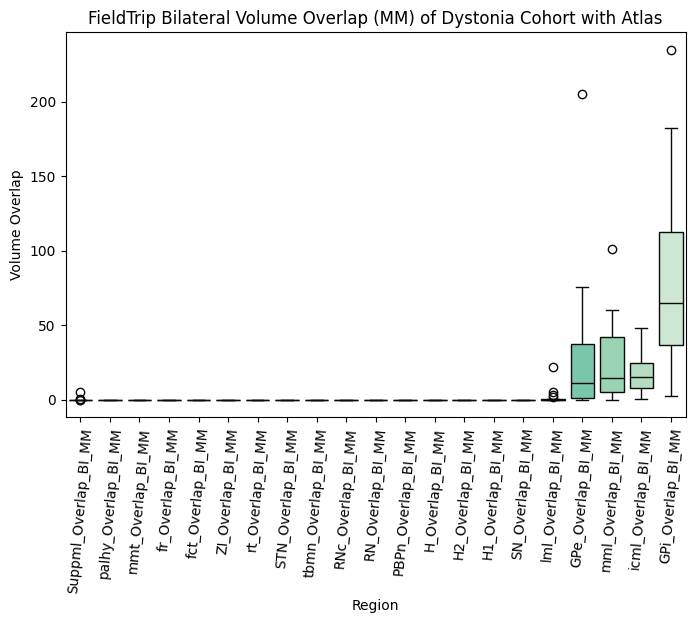

/var/folders/wf/8pxjw4251t7fl_l85_v1_33r0000gp/T/ipykernel_51734/1208145886.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Column', y='Value', data=melted_df,palette='mako',order=sorted_columns)


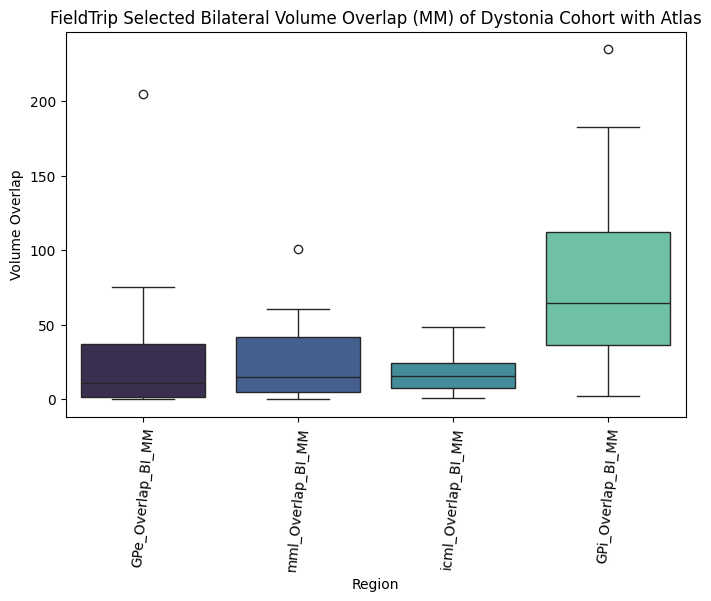

In [51]:
#plot overlaps
def plot_overlap(df,columns_to_include,title,path):
    selected_df = df[columns_to_include]
    melted_df = selected_df.melt(var_name='Column', value_name='Value')
    median_values = melted_df.groupby('Column')['Value'].median().sort_values()
    sorted_columns = median_values.index.tolist()

    plt.figure(figsize=(8, 5))
    ax = sns.boxplot(x='Column', y='Value', data=melted_df,palette='mako',order=sorted_columns)
    ax.set(xlabel = 'Region',ylabel='Volume Overlap',title=title)
    ax.tick_params(axis='x', rotation=85)
    plt.savefig(path)
    plt.show()

#select columns to include- just plotting bilateral mm
cols = []
for r in regions:
    cols.append(f'{r}_Overlap_BI_MM')

#load in csv
fieldtrip_df = pd.read_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Dystonia_FieldTrip_Atlas_Volume_Overlaps.csv')

#call function, update path
plot_overlap(fieldtrip_df,(cols),'FieldTrip Bilateral Volume Overlap (MM) of Dystonia Cohort with Atlas','/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/Dystonia/Overlaps/Bilateral Volume Overlap (MM) of Dystonia Cohort with Atlas.png')
#call function, update path, this is for just the selected columns that have overlap
plot_overlap(fieldtrip_df,(['GPe_Overlap_BI_MM','GPi_Overlap_BI_MM','icml_Overlap_BI_MM','mml_Overlap_BI_MM']),'FieldTrip Selected Bilateral Volume Overlap (MM) of Dystonia Cohort with Atlas','/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/Dystonia/Overlaps/Selected Bilateral Volume Overlap (MM) of Berlin51 Cohort with Atlas.png')

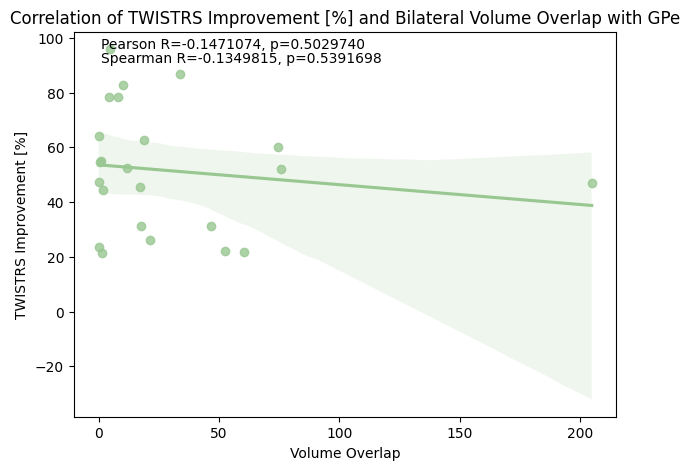

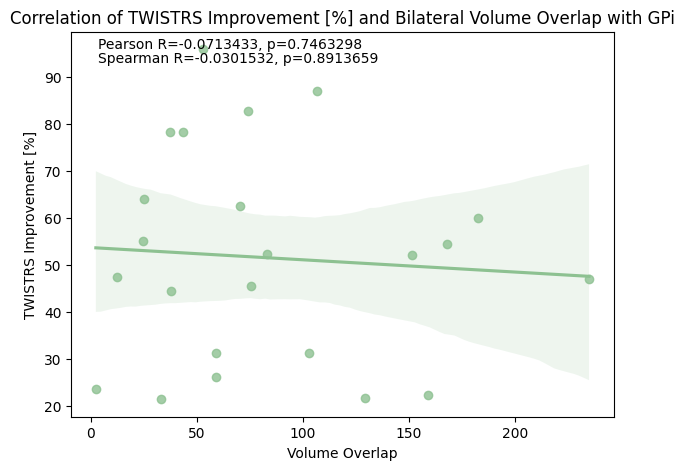

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


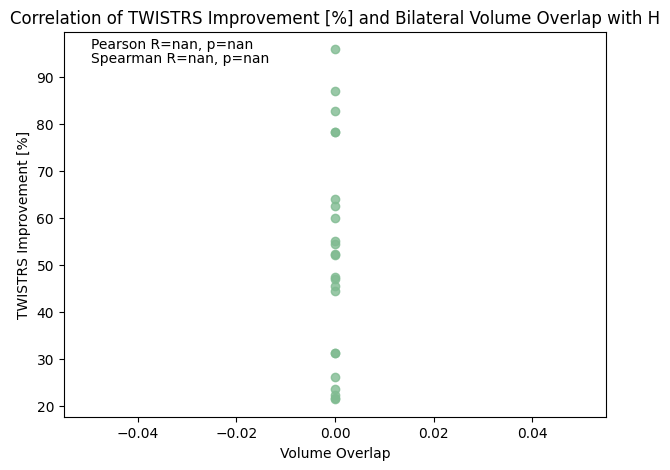

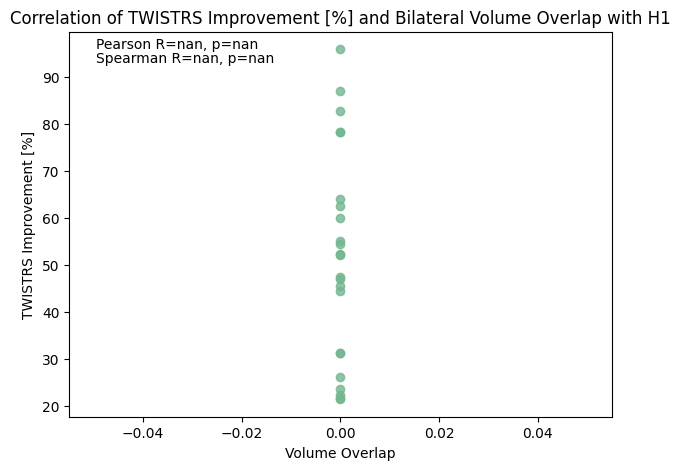

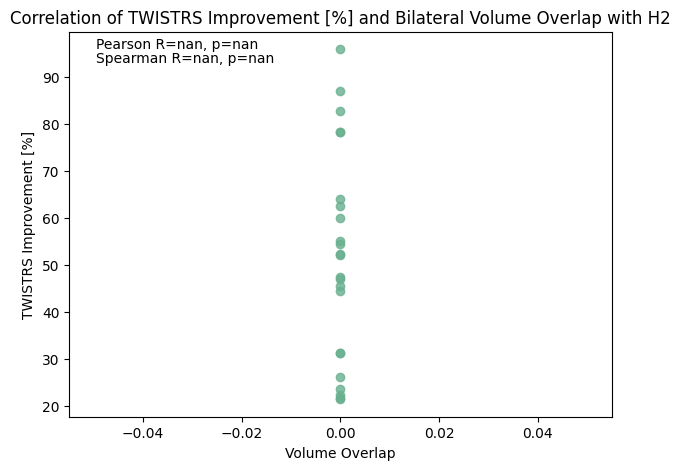

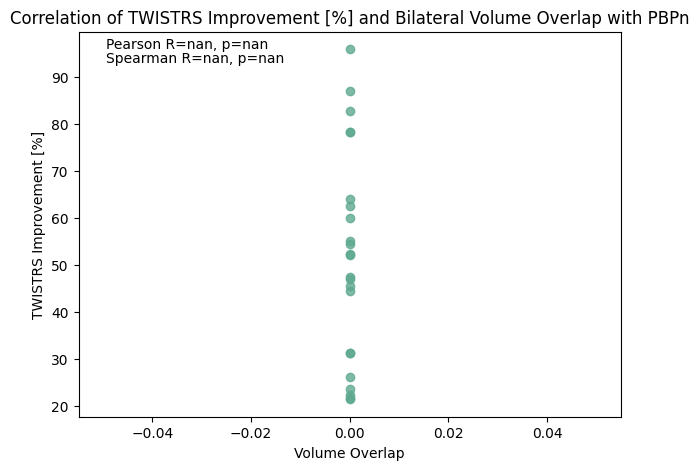

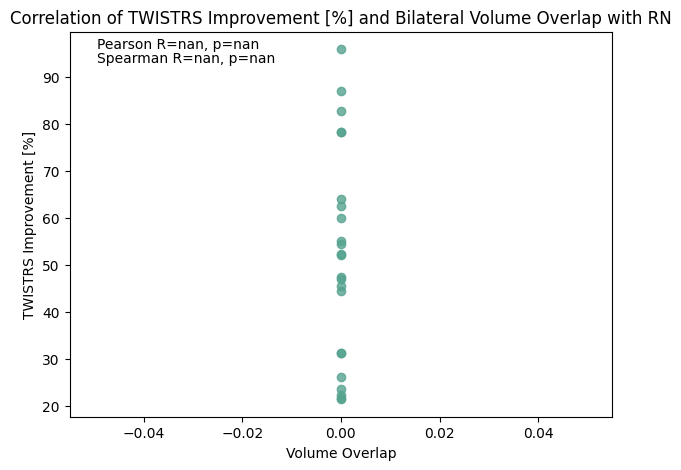

...

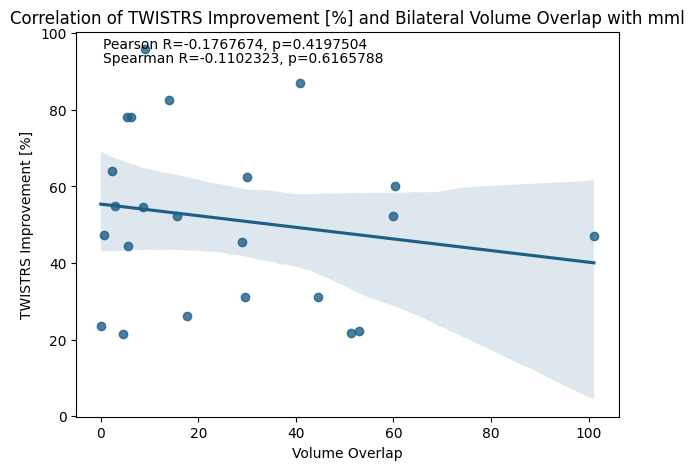

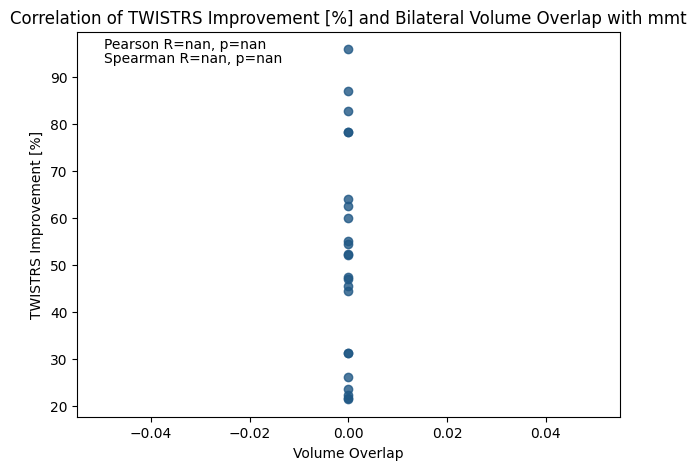

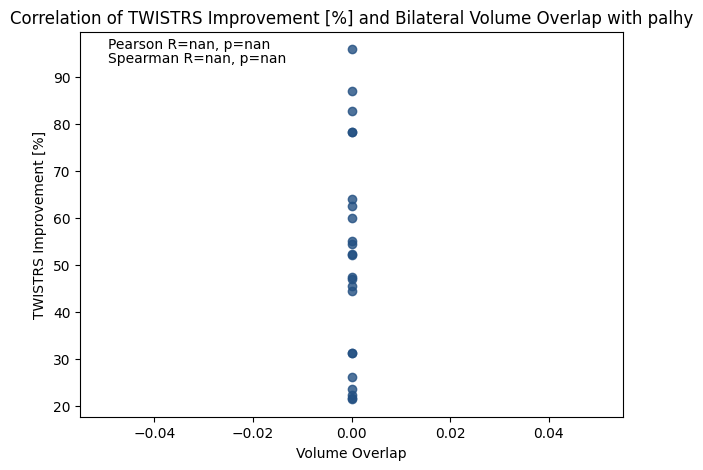

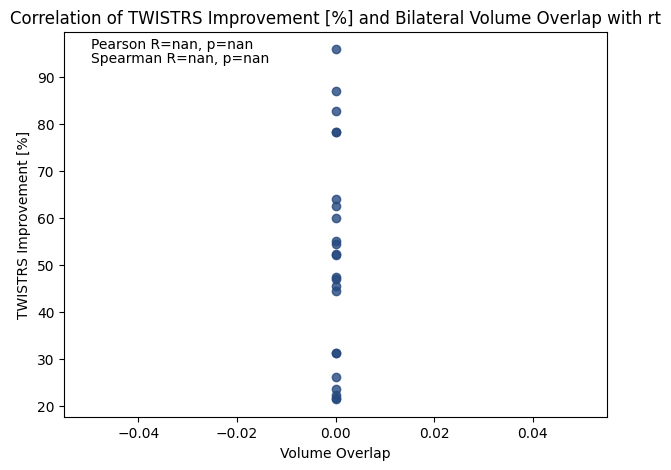

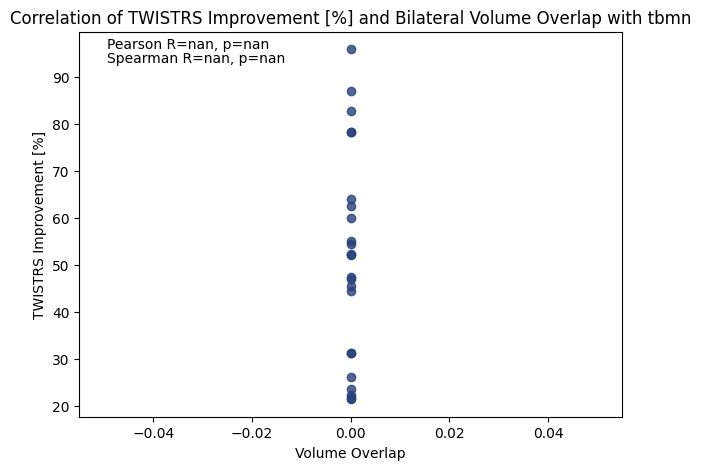

In [56]:
#field trip correlations
df = pd.read_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Dystonia_FieldTrip_Atlas_Volume_Overlaps.csv')
df = df.dropna() #to drop nans from the csv, this weirdly happened here but the others are fine
#list of regions and colors
regions = ['GPe','GPi','H','H1','H2','PBPn','RN','RNc','SN','STN','Suppml','ZI','fct','fr','icml','lml','mml','mmt','palhy','rt','tbmn']
colors = ['#99c791', '#8dc191', '#80bb91', '#74b690', '#69b090', '#5fa990', '#56a390', '#4d9c90', '#45958f', '#3e8f8e', '#37888e', '#30828d', '#297b8c', '#23758b', '#1e6e8a', '#1c6689', '#1d5f87', '#205885', '#235082', '#26497e', '#29417a', '#2b3975']

def r_p(vol_overlap_col): #get the pearson and spearman r and p values
    pearson_r, pearson_p = pearsonr(df['Twstrs_Improvement%'],df[vol_overlap_col])
    spearman_r, spearman_p = spearmanr(df['Twstrs_Improvement%'],df[vol_overlap_col])
    return pearson_r, pearson_p, spearman_r, spearman_p

#plot the graph
def plot_analysis(x_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,path):
    plt.figure(figsize=(7, 5)) #change figure dimensions
    ax = sns.regplot(x=x_data, y=df['Twstrs_Improvement%'], color=color) #which columns to plot- clinical outcomes and bilateral mm overlap
    plt.title(title) #title
    plt.xlabel('Volume Overlap') #x-axis label
    plt.ylabel('TWISTRS Improvement [%]') #y-axis label
    #position the r and p values at top left corner
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),transform=ax.transAxes, verticalalignment='top')
    plt.savefig(path) #save the plots as png
    plt.show() #print out the plots
    
for c, r in enumerate(regions):
    color = colors[c % len(colors)] #loop over the colors for each graph
    pearson_r,pearson_p,spearman_r,spearman_p = r_p(f'{r}_Overlap_BI_MM') #call the function so each regions' r and p values are calculated
    #plot the graphs, providing the bilateral mm columns, title, and path to save- need to update
    plot_analysis(df[f'{r}_Overlap_BI_MM'],f'Correlation of TWISTRS Improvement [%] and Bilateral Volume Overlap with {r}',pearson_r,pearson_p,spearman_r,spearman_p,color,f'/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/Dystonia/Correlations/Bilateral Volume Overlap with {r}.png')

# Berlin51 Plots

/var/folders/wf/8pxjw4251t7fl_l85_v1_33r0000gp/T/ipykernel_51734/1072888144.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Column', y='Value', data=melted_df,palette='mako',order=sorted_columns)


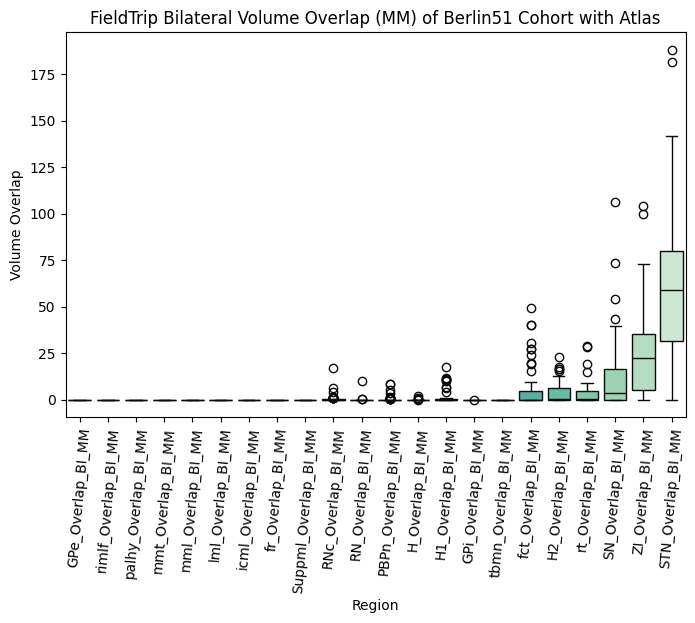

/var/folders/wf/8pxjw4251t7fl_l85_v1_33r0000gp/T/ipykernel_51734/1072888144.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Column', y='Value', data=melted_df,palette='mako',order=sorted_columns)


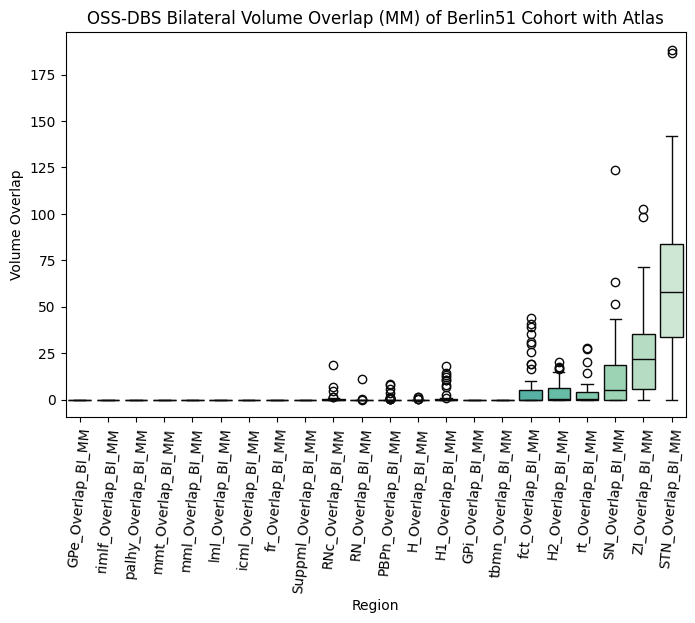

/var/folders/wf/8pxjw4251t7fl_l85_v1_33r0000gp/T/ipykernel_51734/1072888144.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Column', y='Value', data=melted_df,palette='mako',order=sorted_columns)


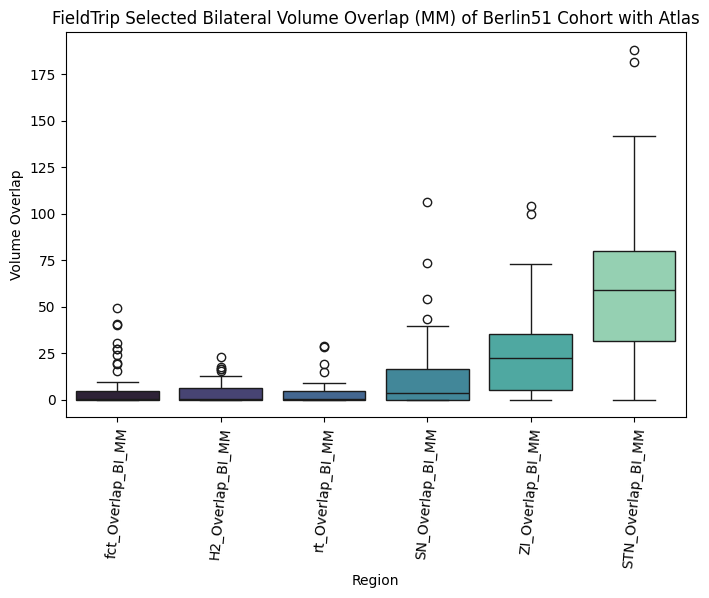

/var/folders/wf/8pxjw4251t7fl_l85_v1_33r0000gp/T/ipykernel_51734/1072888144.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='Column', y='Value', data=melted_df,palette='mako',order=sorted_columns)


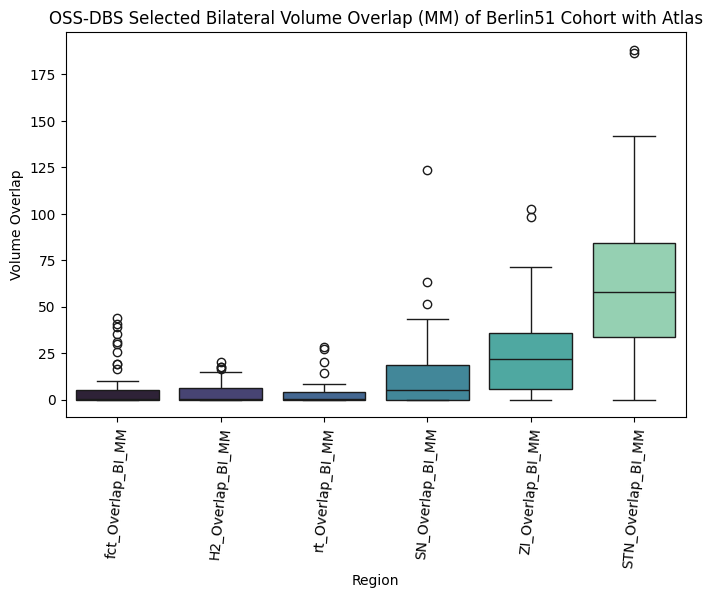

In [38]:
#plot overlaps
def plot_overlap(df,columns_to_include,title,path):
    selected_df = df[columns_to_include]
    melted_df = selected_df.melt(var_name='Column', value_name='Value')
    median_values = melted_df.groupby('Column')['Value'].median().sort_values()
    sorted_columns = median_values.index.tolist()

    plt.figure(figsize=(8, 5))
    ax = sns.boxplot(x='Column', y='Value', data=melted_df,palette='mako',order=sorted_columns)
    ax.set(xlabel = 'Region',ylabel='Volume Overlap',title=title)
    ax.tick_params(axis='x', rotation=85)
    plt.savefig(path)
    plt.show()

cols = []
for r in regions:
    cols.append(f'{r}_Overlap_BI_MM')
    
fieldtrip_df = pd.read_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/FieldTrip_Atlas_Volume_Overlaps.csv')
ossdbs_df = pd.read_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/OSS-DBS_Atlas_Volume_Overlaps.csv')

plot_overlap(fieldtrip_df,(cols),'FieldTrip Bilateral Volume Overlap (MM) of Berlin51 Cohort with Atlas','/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/FieldTrip/Overlaps/Bilateral Volume Overlap (MM) of Berlin51 Cohort with Atlas.png')
plot_overlap(ossdbs_df,(cols),'OSS-DBS Bilateral Volume Overlap (MM) of Berlin51 Cohort with Atlas','/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/OSS-DBS/Overlaps/Bilateral Volume Overlap (MM) of Berlin51 Cohort with Atlas.png')

plot_overlap(fieldtrip_df,(['rt_Overlap_BI_MM','fct_Overlap_BI_MM','ZI_Overlap_BI_MM','STN_Overlap_BI_MM','SN_Overlap_BI_MM','H2_Overlap_BI_MM']),'FieldTrip Selected Bilateral Volume Overlap (MM) of Berlin51 Cohort with Atlas','/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/FieldTrip/Overlaps/Selected Bilateral Volume Overlap (MM) of Berlin51 Cohort with Atlas.png')
plot_overlap(ossdbs_df,(['rt_Overlap_BI_MM','fct_Overlap_BI_MM','ZI_Overlap_BI_MM','STN_Overlap_BI_MM','SN_Overlap_BI_MM','H2_Overlap_BI_MM']),'OSS-DBS Selected Bilateral Volume Overlap (MM) of Berlin51 Cohort with Atlas','/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/OSS-DBS/Overlaps/Selected Bilateral Volume Overlap (MM) of Berlin51 Cohort with Atlas.png')

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


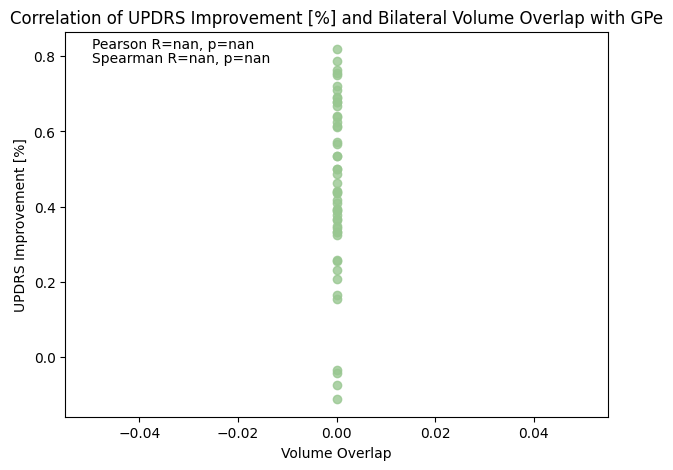

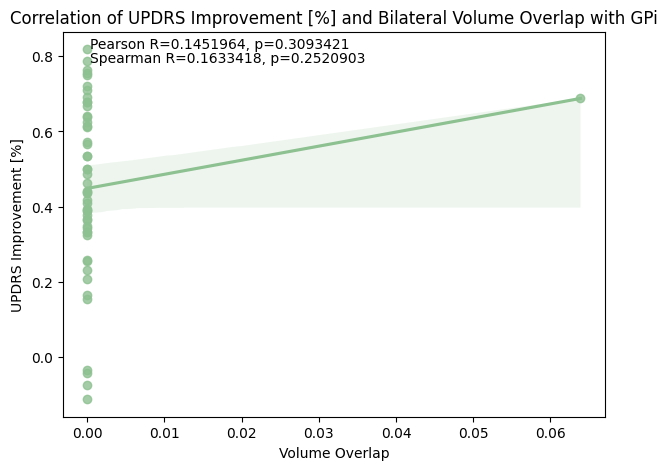

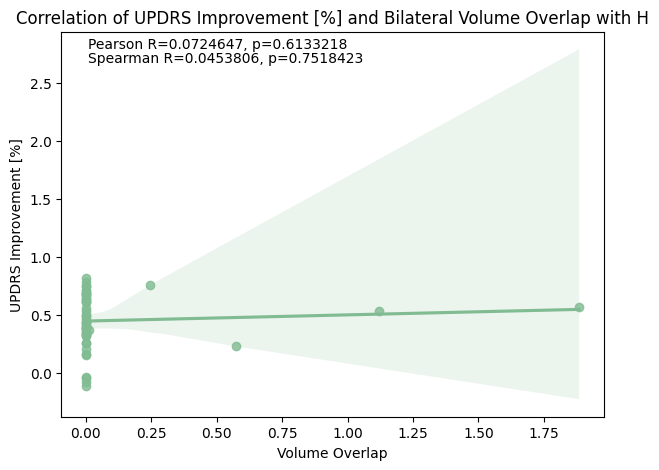

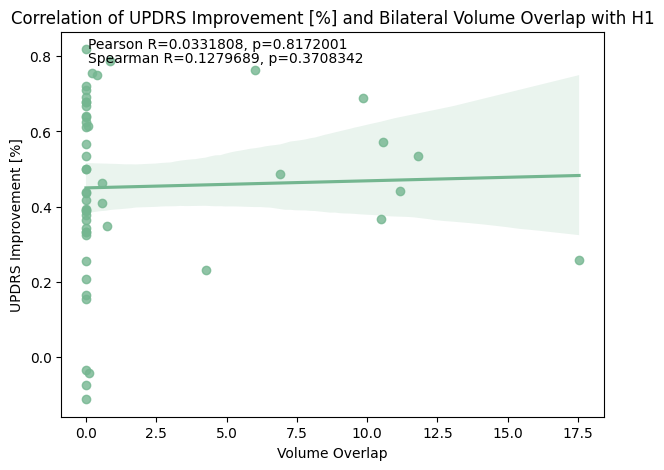

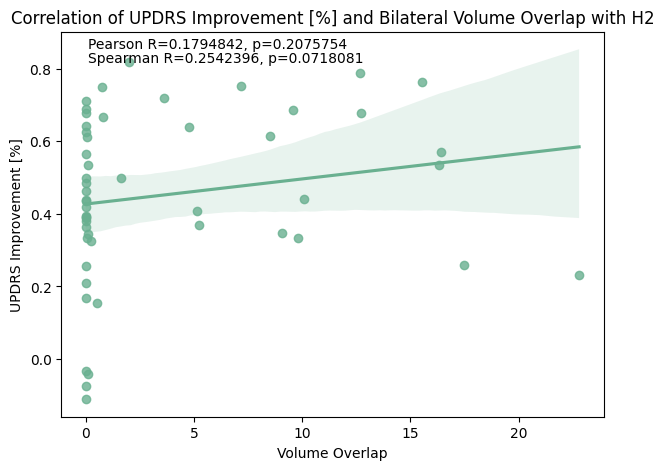

...

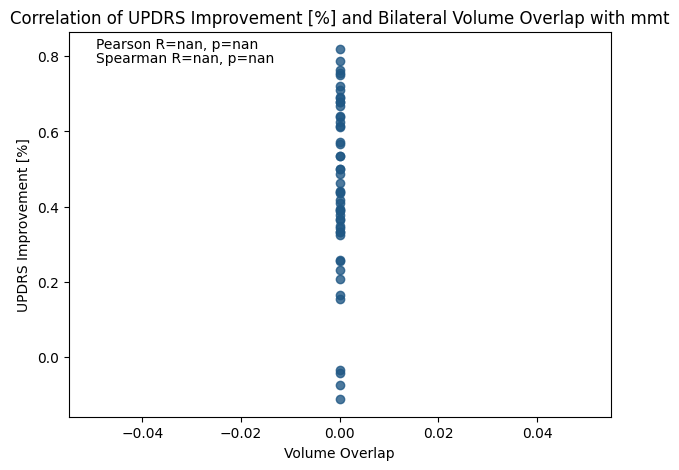

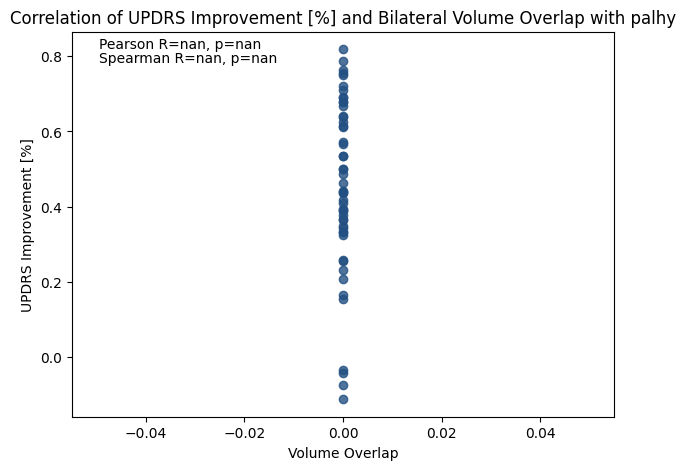

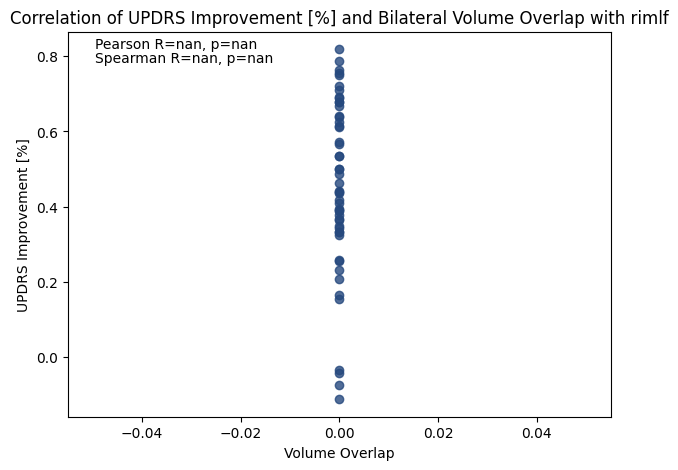

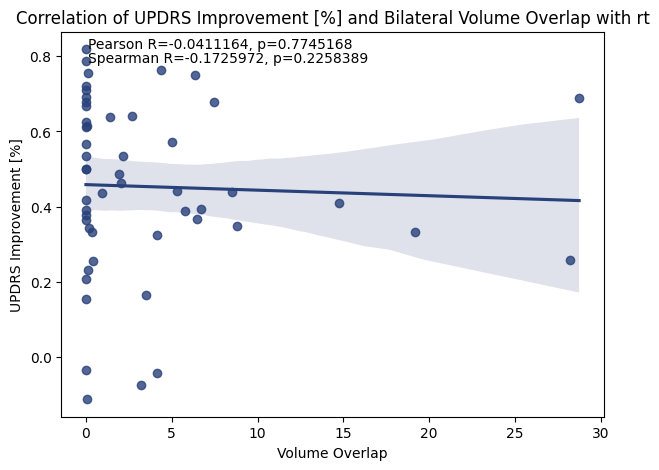

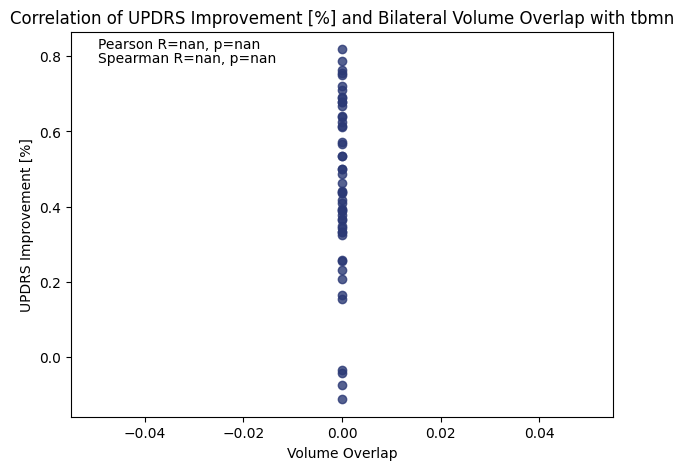

In [27]:
#field trip correlations- UPDRS
df = pd.read_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/FieldTrip_Atlas_Volume_Overlaps.csv')
regions = ['GPe','GPi','H','H1','H2','PBPn','RN','RNc','SN','STN','Suppml','ZI','fct','fr','icml','lml','mml','mmt','palhy','rimlf','rt','tbmn']
colors = ['#99c791', '#8dc191', '#80bb91', '#74b690', '#69b090', '#5fa990', '#56a390', '#4d9c90', '#45958f', '#3e8f8e', '#37888e', '#30828d', '#297b8c', '#23758b', '#1e6e8a', '#1c6689', '#1d5f87', '#205885', '#235082', '#26497e', '#29417a', '#2b3975']

def r_p(vol_overlap_col):
    pearson_r, pearson_p = pearsonr(df['UPDRS_Improvement_Perc'],df[vol_overlap_col])
    spearman_r, spearman_p = spearmanr(df['UPDRS_Improvement_Perc'],df[vol_overlap_col])
    return pearson_r, pearson_p, spearman_r, spearman_p

#plot the graph
def plot_analysis(x_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,path):
    plt.figure(figsize=(7, 5))
    ax = sns.regplot(x=x_data, y=df['UPDRS_Improvement_Perc'], color=color)
    plt.title(title)
    plt.xlabel('Volume Overlap')
    plt.ylabel('UPDRS Improvement [%]')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),transform=ax.transAxes, verticalalignment='top')
    plt.savefig(path)
    plt.show()
    
for c, r in enumerate(regions):
    color = colors[c % len(colors)]
    pearson_r,pearson_p,spearman_r,spearman_p = r_p(f'{r}_Overlap_BI_MM')
    plot_analysis(df[f'{r}_Overlap_BI_MM'],f'Correlation of UPDRS Improvement [%] and Bilateral Volume Overlap with {r}',pearson_r,pearson_p,spearman_r,spearman_p,color,f'/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/Bilateral Volume Overlap with {r}.png')

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


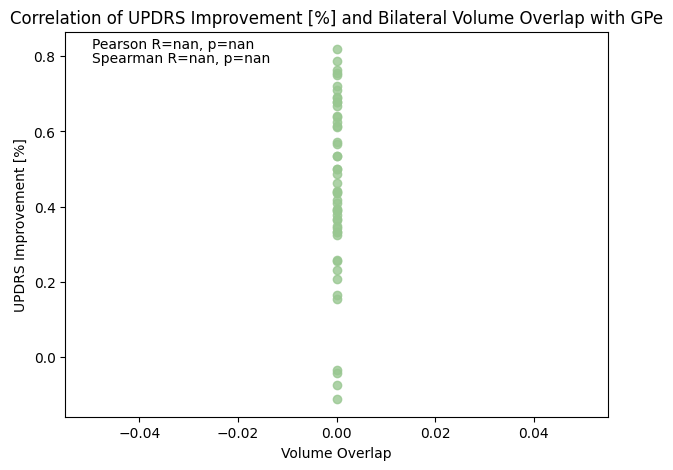

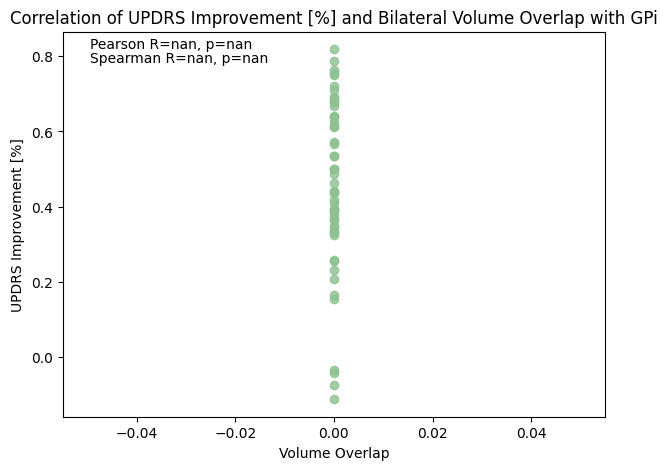

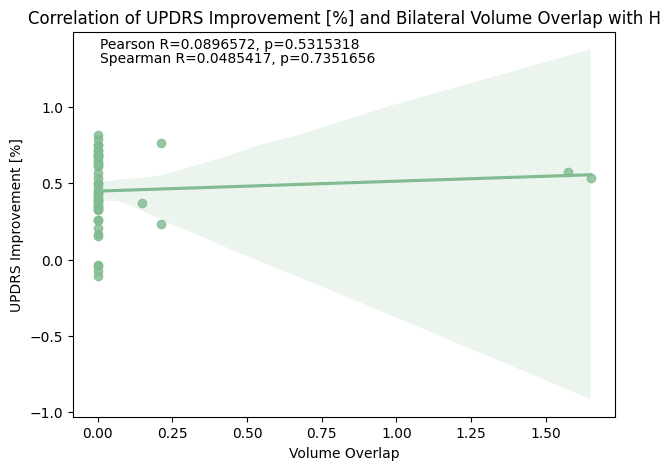

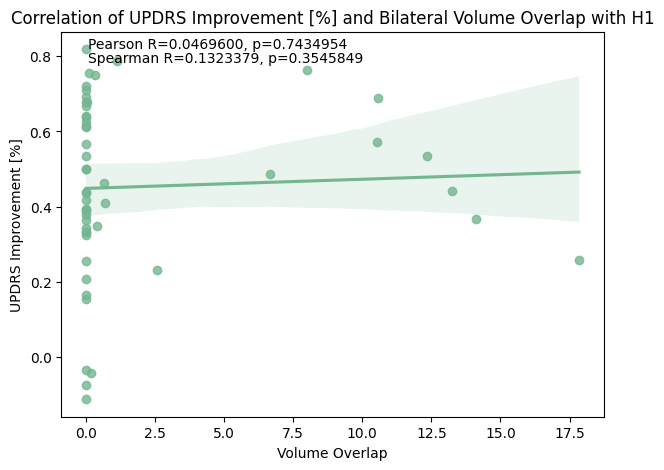

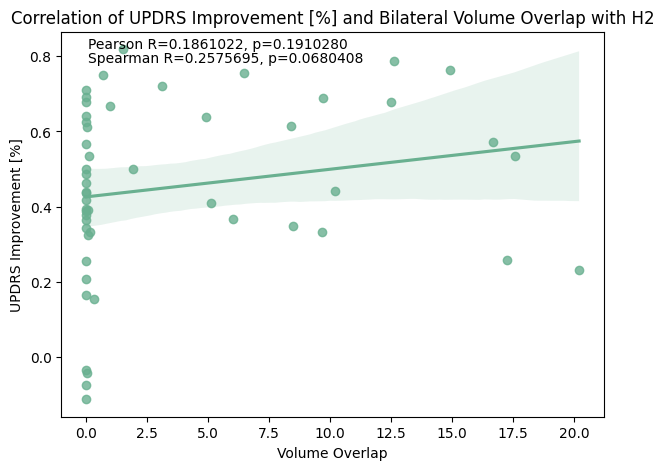

...

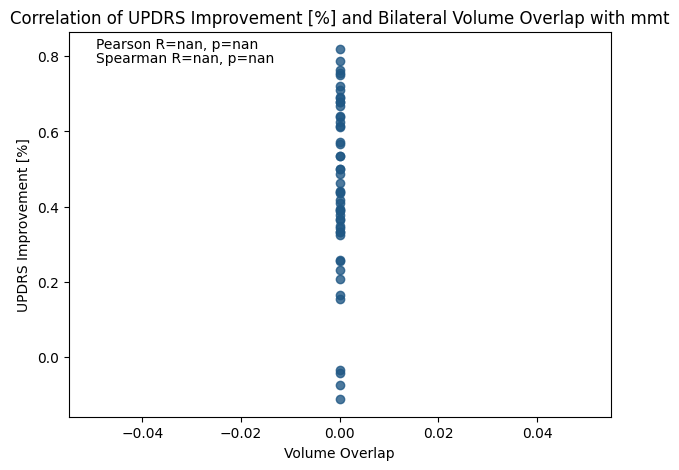

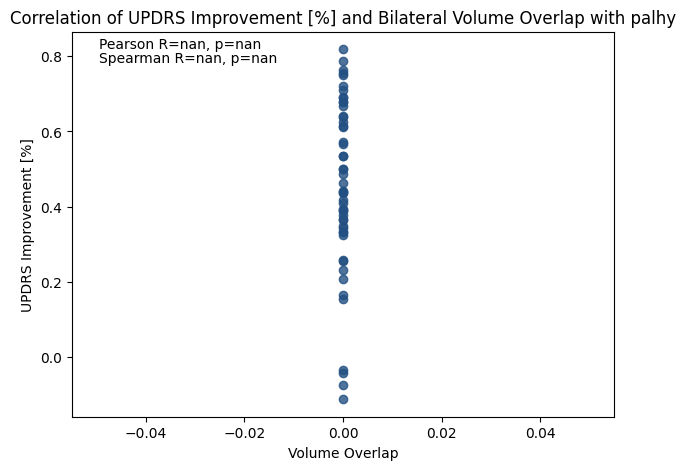

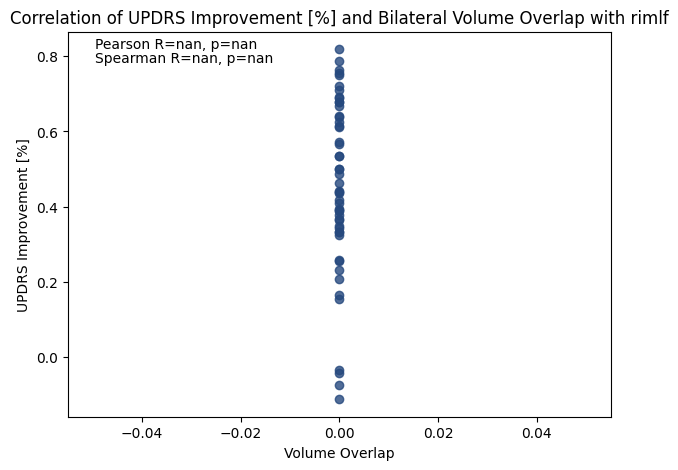

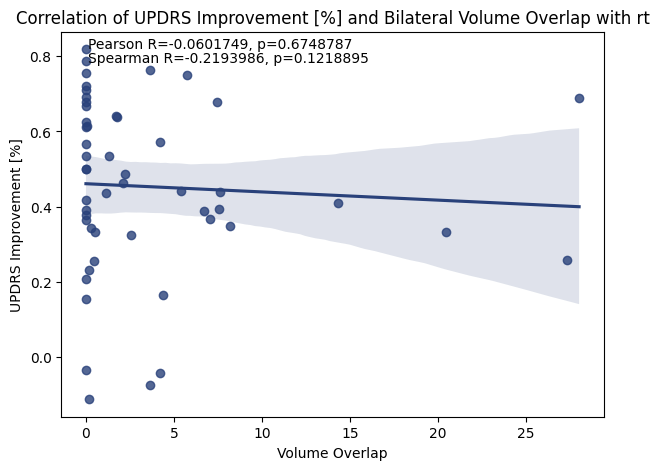

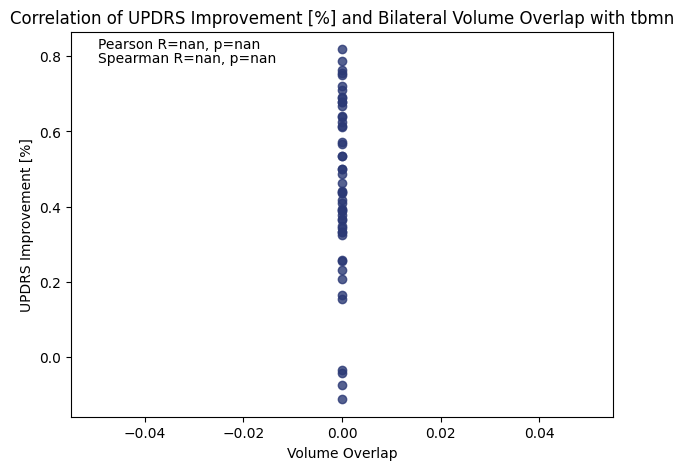

In [28]:
#oss-dbs correlations- UPDRS
df = pd.read_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/OSS-DBS_Atlas_Volume_Overlaps.csv')
regions = ['GPe','GPi','H','H1','H2','PBPn','RN','RNc','SN','STN','Suppml','ZI','fct','fr','icml','lml','mml','mmt','palhy','rimlf','rt','tbmn']
colors = ['#99c791', '#8dc191', '#80bb91', '#74b690', '#69b090', '#5fa990', '#56a390', '#4d9c90', '#45958f', '#3e8f8e', '#37888e', '#30828d', '#297b8c', '#23758b', '#1e6e8a', '#1c6689', '#1d5f87', '#205885', '#235082', '#26497e', '#29417a', '#2b3975']

def r_p(vol_overlap_col):
    pearson_r, pearson_p = pearsonr(df['UPDRS_Improvement_Perc'],df[vol_overlap_col])
    spearman_r, spearman_p = spearmanr(df['UPDRS_Improvement_Perc'],df[vol_overlap_col])
    return pearson_r, pearson_p, spearman_r, spearman_p

#plot the graph
def plot_analysis(x_data, title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,path):
    plt.figure(figsize=(7, 5))
    ax = sns.regplot(x=x_data, y=df['UPDRS_Improvement_Perc'], color=color)
    plt.title(title)
    plt.xlabel('Volume Overlap')
    plt.ylabel('UPDRS Improvement [%]')
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),transform=ax.transAxes, verticalalignment='top')
    plt.savefig(path)
    plt.show()
    
for c, r in enumerate(regions):
    color = colors[c % len(colors)]
    pearson_r,pearson_p,spearman_r,spearman_p = r_p(f'{r}_Overlap_BI_MM')
    plot_analysis(df[f'{r}_Overlap_BI_MM'],f'Correlation of UPDRS Improvement [%] and Bilateral Volume Overlap with {r}',pearson_r,pearson_p,spearman_r,spearman_p,color,f'/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/OSS-DBS/Correlations/Bilateral Volume Overlap with {r}.png')

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


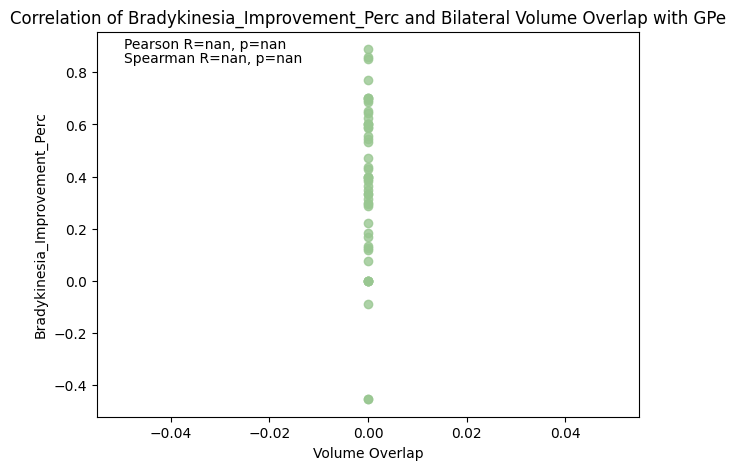

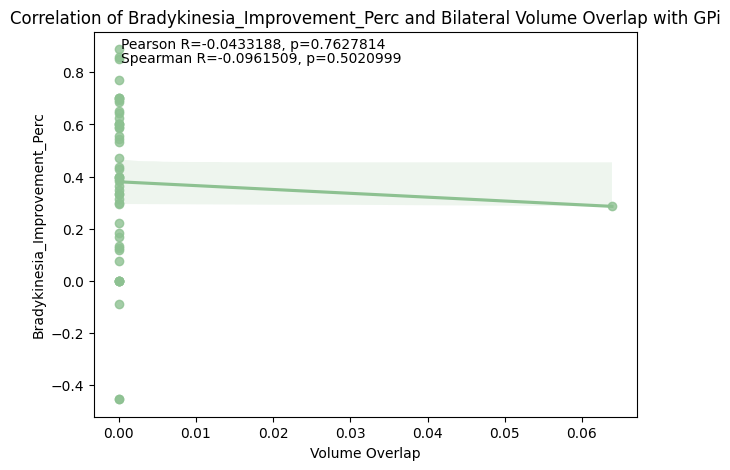

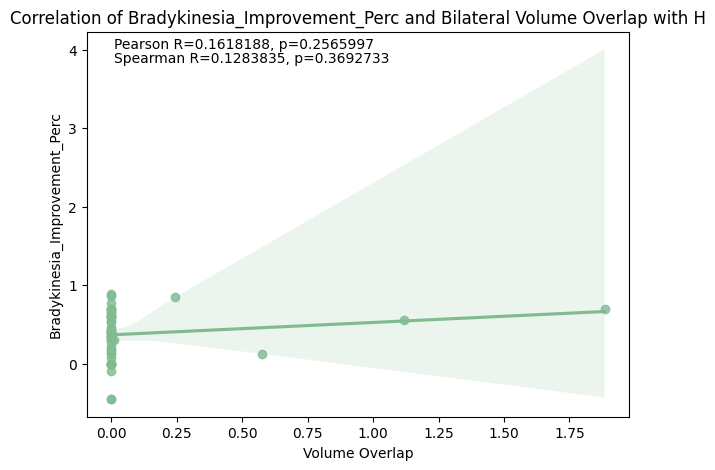

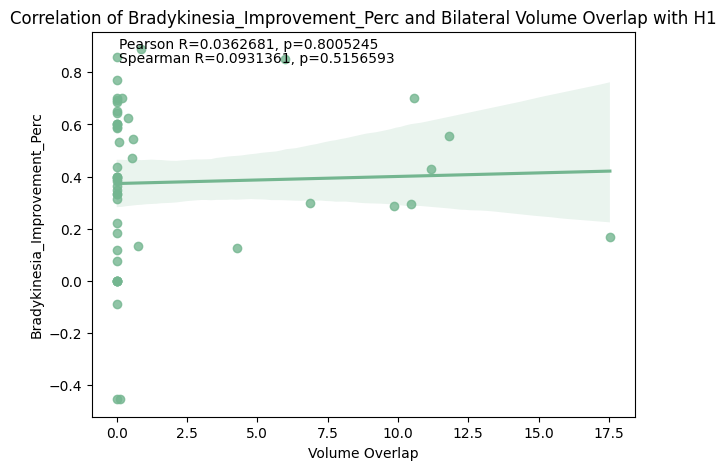

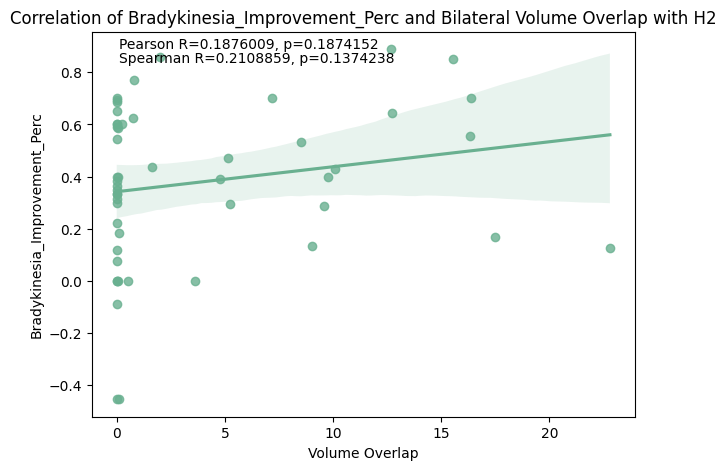

...

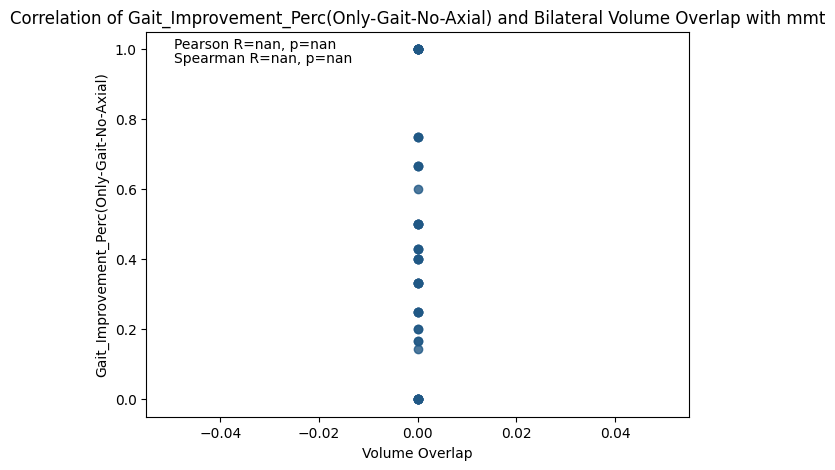

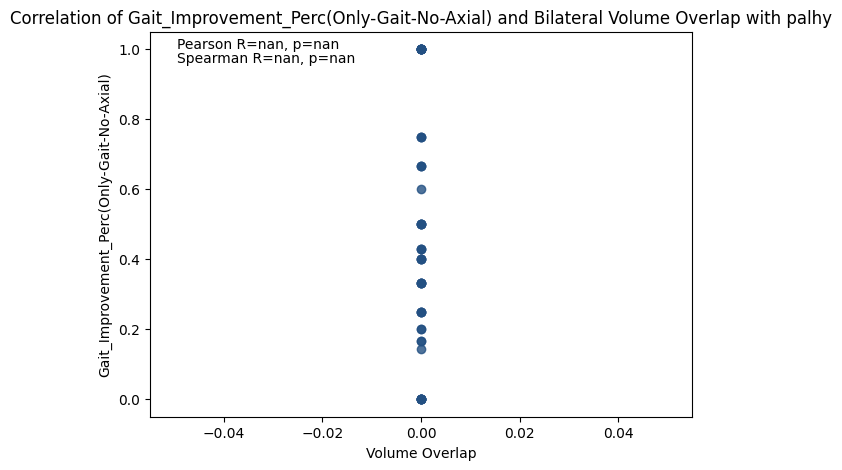

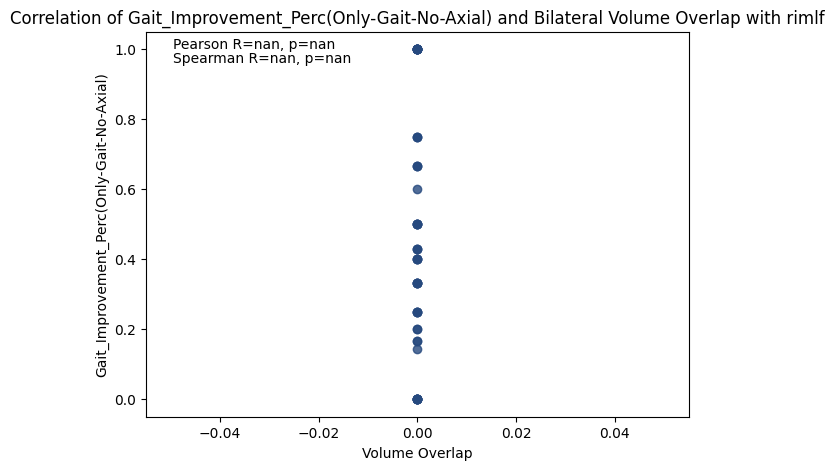

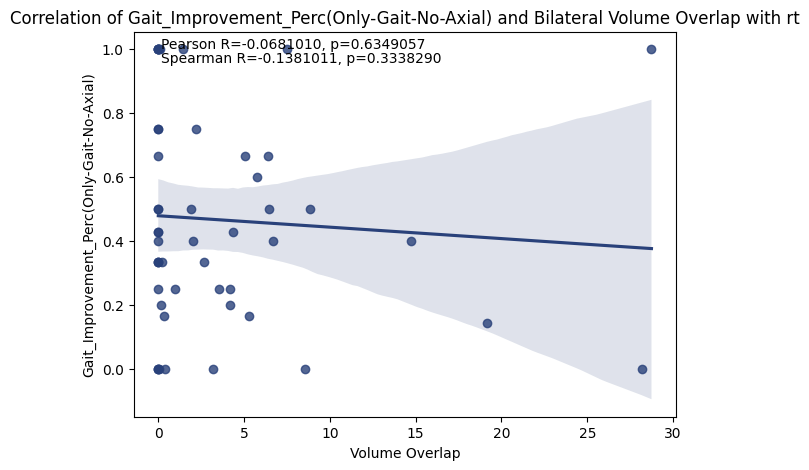

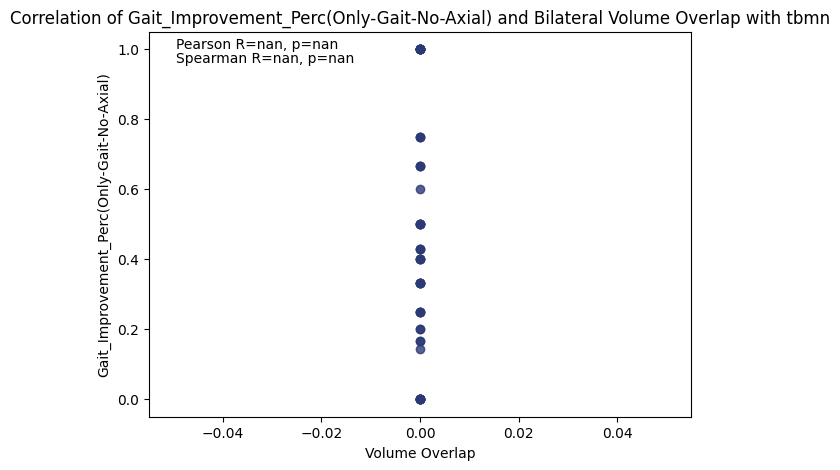

In [69]:
#field trip correlations- all other clinical outcomes
df = pd.read_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Berlin51_FieldTrip_Atlas_Volume_Overlaps.csv')
regions = ['GPe','GPi','H','H1','H2','PBPn','RN','RNc','SN','STN','Suppml','ZI','fct','fr','icml','lml','mml','mmt','palhy','rimlf','rt','tbmn']
colors = ['#99c791', '#8dc191', '#80bb91', '#74b690', '#69b090', '#5fa990', '#56a390', '#4d9c90', '#45958f', '#3e8f8e', '#37888e', '#30828d', '#297b8c', '#23758b', '#1e6e8a', '#1c6689', '#1d5f87', '#205885', '#235082', '#26497e', '#29417a', '#2b3975']
clinical = ['Bradykinesia_Improvement_Perc','Rigidity_Improvement_Perc','Axial_Improvement_Perc','Tremor_Improvement_Perc_Threshold2','Axial_Improvement_Perc(Only-Axial-No-Gait)','Gait_Improvement_Perc(Only-Gait-No-Axial)']
output_dir = '/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/Berlin51/FieldTrip/Correlations'

def r_p(co_col,vol_overlap_col):
    pearson_r, pearson_p = pearsonr(df[co_col],df[vol_overlap_col])
    spearman_r, spearman_p = spearmanr(df[co_col],df[vol_overlap_col])
    return pearson_r, pearson_p, spearman_r, spearman_p

#plot the graph
def plot_analysis(x_data, co_col,title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,path):
    plt.figure(figsize=(7, 5))
    ax = sns.regplot(x=x_data, y=df[co_col], color=color)
    plt.title(title)
    plt.xlabel('Volume Overlap')
    plt.ylabel(co_col)
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),transform=ax.transAxes, verticalalignment='top')
    plt.savefig(path)
    plt.show()
    
for clinical_outcome in clinical:
    for c, region in enumerate(regions):
        color = colors[c % len(colors)]
        vol_overlap_col = f'{region}_Overlap_BI_MM'
        pearson_r, pearson_p, spearman_r, spearman_p = r_p(clinical_outcome, vol_overlap_col)

        title = f'Correlation of {clinical_outcome} and Bilateral Volume Overlap with {region}'
        specific_output_dir = os.path.join(output_dir, clinical_outcome)
        os.makedirs(specific_output_dir, exist_ok=True)
        path = os.path.join(specific_output_dir, f'Bilateral Volume Overlap with {region}.png')

        plot_analysis(df[vol_overlap_col], clinical_outcome, title, pearson_r, pearson_p, spearman_r, spearman_p, color, path)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


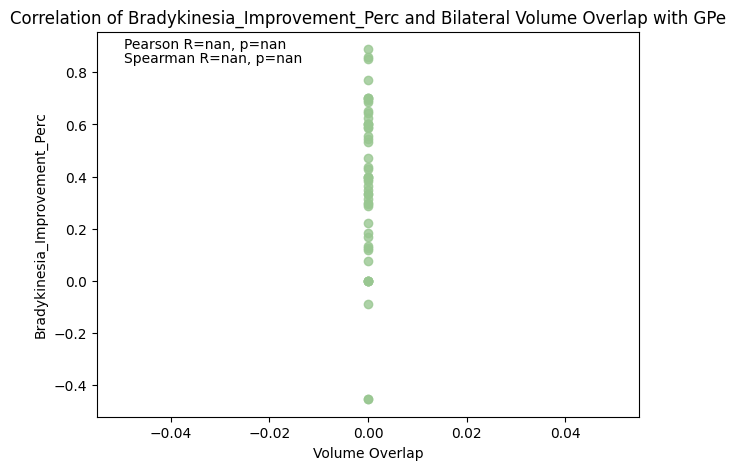

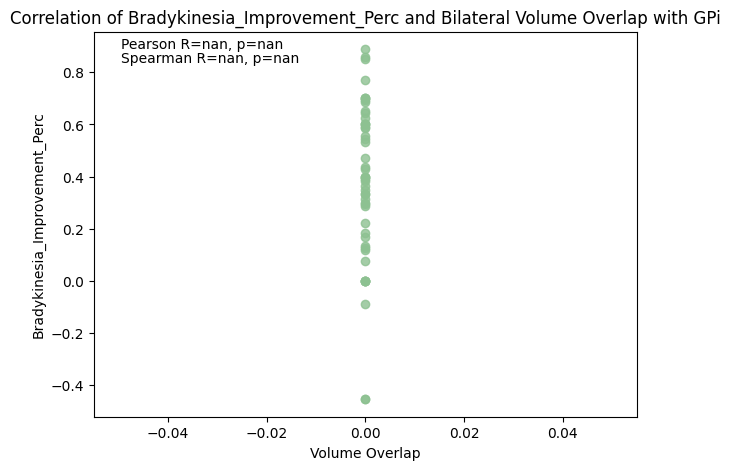

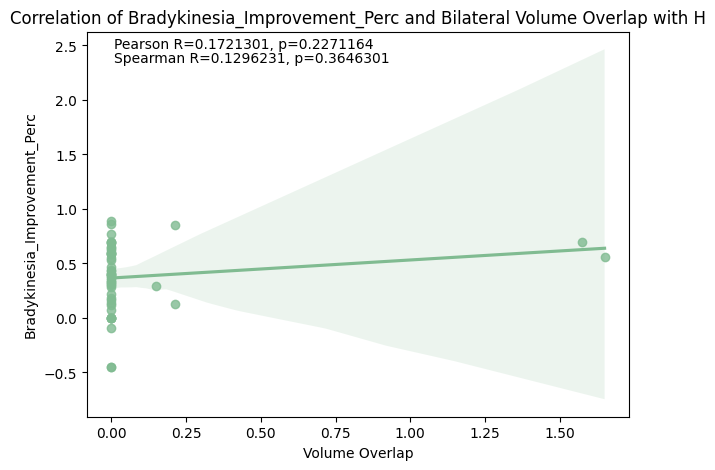

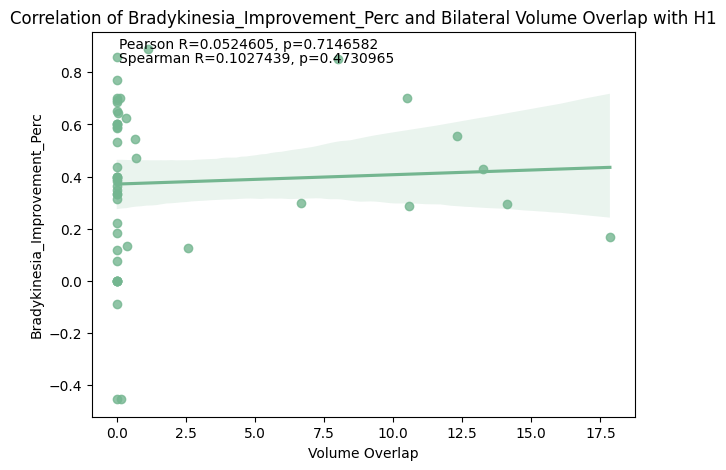

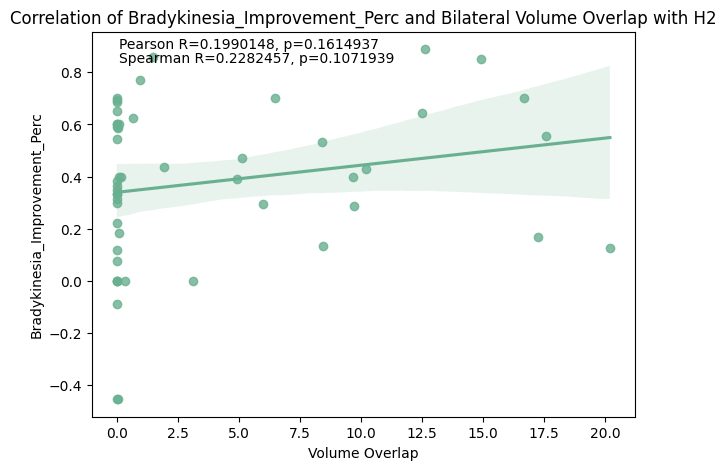

...

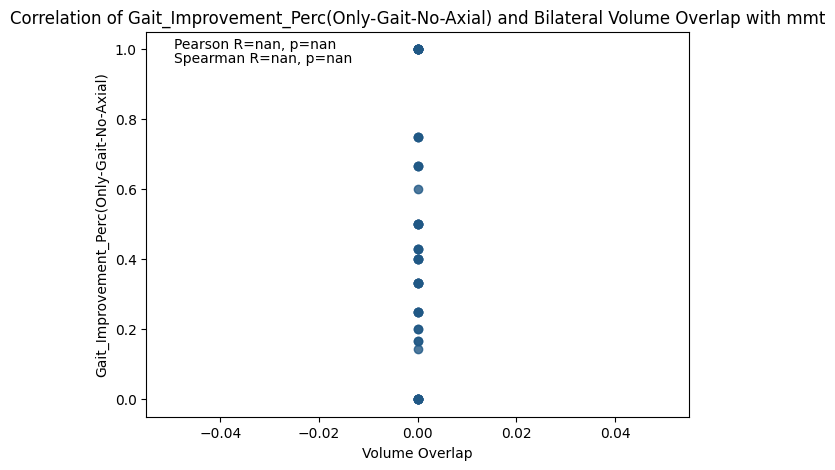

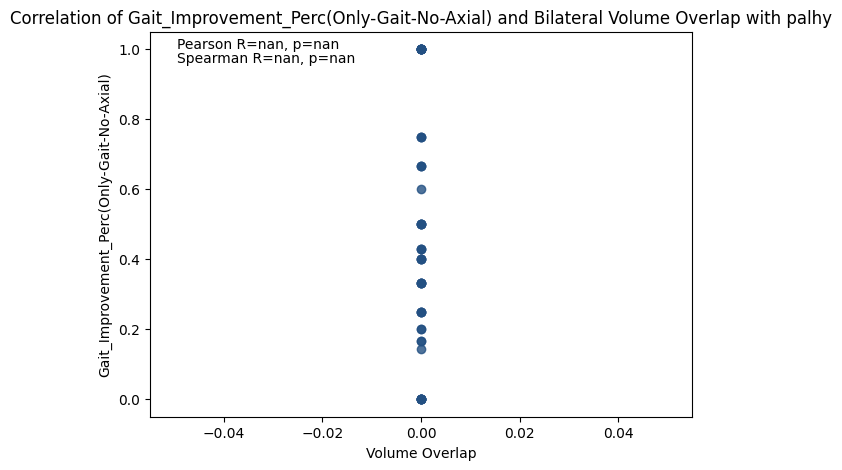

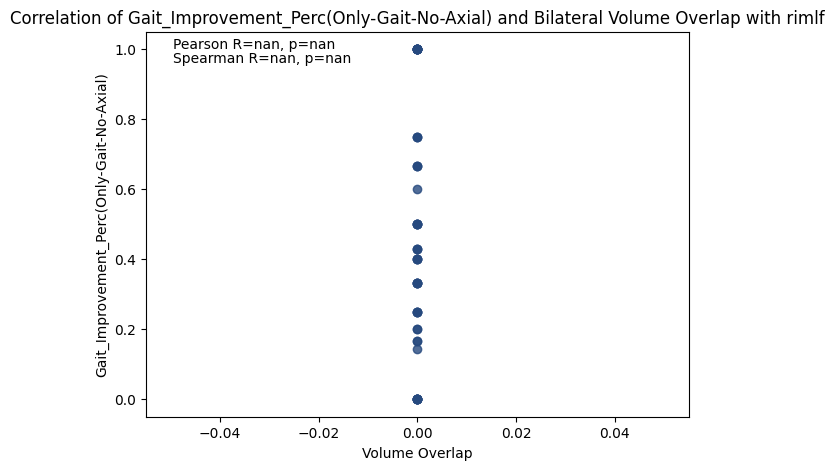

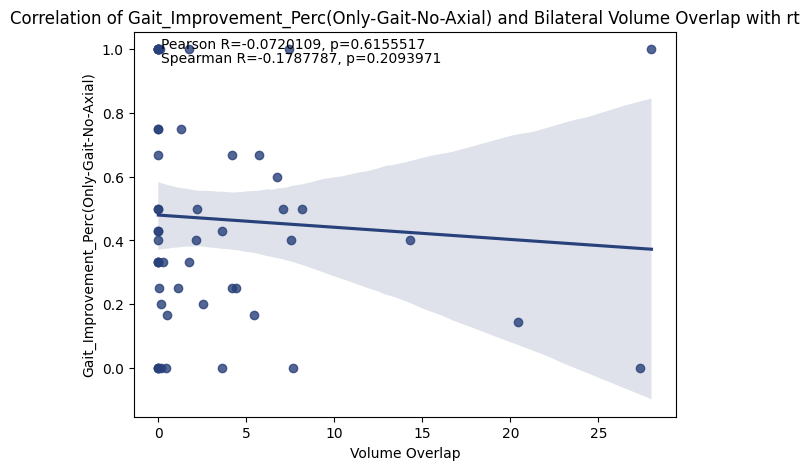

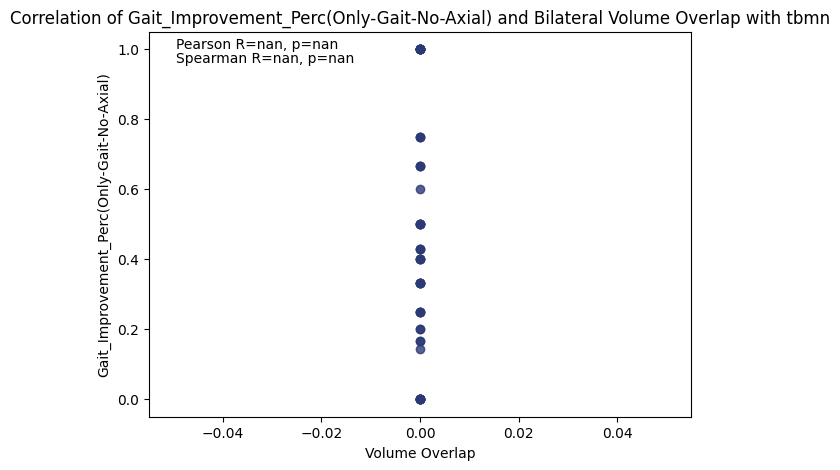

In [71]:
#oss-dbs correlations- all other clinical outcomes
df = pd.read_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Berlin51_OSS-DBS_Atlas_Volume_Overlaps.csv')
regions = ['GPe','GPi','H','H1','H2','PBPn','RN','RNc','SN','STN','Suppml','ZI','fct','fr','icml','lml','mml','mmt','palhy','rimlf','rt','tbmn']
colors = ['#99c791', '#8dc191', '#80bb91', '#74b690', '#69b090', '#5fa990', '#56a390', '#4d9c90', '#45958f', '#3e8f8e', '#37888e', '#30828d', '#297b8c', '#23758b', '#1e6e8a', '#1c6689', '#1d5f87', '#205885', '#235082', '#26497e', '#29417a', '#2b3975']
clinical = ['Bradykinesia_Improvement_Perc','Rigidity_Improvement_Perc','Axial_Improvement_Perc','Tremor_Improvement_Perc_Threshold2','Axial_Improvement_Perc(Only-Axial-No-Gait)','Gait_Improvement_Perc(Only-Gait-No-Axial)']
output_dir = '/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Figures/Berlin51/OSS-DBS/Correlations'

def r_p(co_col,vol_overlap_col):
    pearson_r, pearson_p = pearsonr(df[co_col],df[vol_overlap_col])
    spearman_r, spearman_p = spearmanr(df[co_col],df[vol_overlap_col])
    return pearson_r, pearson_p, spearman_r, spearman_p

#plot the graph
def plot_analysis(x_data, co_col,title, pearson_r_val, pearson_p_val, spearman_r_val, spearman_p_val, color,path):
    plt.figure(figsize=(7, 5))
    ax = sns.regplot(x=x_data, y=df[co_col], color=color)
    plt.title(title)
    plt.xlabel('Volume Overlap')
    plt.ylabel(co_col)
    ax.text(0.05, 0.95, 'Pearson R={:.7f}, p={:.7f}'.format(pearson_r_val, pearson_p_val),transform=ax.transAxes, verticalalignment='bottom')
    ax.text(0.05, 0.95, 'Spearman R={:.7f}, p={:.7f}'.format(spearman_r_val, spearman_p_val),transform=ax.transAxes, verticalalignment='top')
    plt.savefig(path)
    plt.show()
    
for clinical_outcome in clinical:
    for c, region in enumerate(regions):
        color = colors[c % len(colors)]
        vol_overlap_col = f'{region}_Overlap_BI_MM'
        pearson_r, pearson_p, spearman_r, spearman_p = r_p(clinical_outcome, vol_overlap_col)

        title = f'Correlation of {clinical_outcome} and Bilateral Volume Overlap with {region}'
        specific_output_dir = os.path.join(output_dir, clinical_outcome)
        os.makedirs(specific_output_dir, exist_ok=True)
        path = os.path.join(specific_output_dir, f'Bilateral Volume Overlap with {region}.png')

        plot_analysis(df[vol_overlap_col], clinical_outcome, title, pearson_r, pearson_p, spearman_r, spearman_p, color, path)

In [39]:
#list out individual colors along a seaborn gradient spectrum
from matplotlib import colors as mcolors
crest_colors = sns.color_palette('crest', 20)

#convert the colors to a list of their hex values
crest_colors_hex = [mcolors.to_hex(color) for color in crest_colors]

print(crest_colors_hex)

['#98c691', '#8ac091', '#7dba91', '#70b390', '#64ad90', '#59a590', '#509e90', '#47978f', '#40908e', '#38898e', '#2f818d', '#287a8c', '#21738b', '#1d6c8a', '#1c6488', '#1e5b86', '#225383', '#254b7f', '#28427a', '#2b3a76']


In [80]:
#make csv with all the structures
directory = '/Users/jp1590/Documents/MATLAB/leaddbs/templates/space/MNI152NLin2009bAsym/atlases'
subfolder = 'lh'

data = {'Atlas_Name': [], 'Structures': []}

for folder in os.listdir(directory):
    folder_path = os.path.join(directory, folder)
    if os.path.isdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder)
        if os.path.exists(subfolder_path) and os.path.isdir(subfolder_path):
            #list the files in the subfolder
            files = os.listdir(subfolder_path)
            #add each folder name and each file to the dictionary
            for file in files:
                data['Atlas_Name'].append(folder)
                data['Structures'].append(file)

df = pd.DataFrame(data)

df.to_csv('/Volumes/Cingulate/NativeMNI_Overlaps/Helen/Lists_of_Atlases.csv', index=False)